In [12]:
import torch.distributions as distrib
import torch.distributions.transforms as transform
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torch as tr

import matplotlib.pyplot as plt

import numpy as np

# Normalizing flows

In this notebook we will:

1. Investigate new trainable transforms and implement them in PyTorch.
2. Fit a flow based model to a complicated density.

The main idea of flow-based models are to express $\mathbf{x}$ as a transformation $f$ of a real vector $\mathbf{z}$ sample from a simple density $p_0(z)$:
$$ x = f(z) \quad \text{where} \quad p_0(z)$$

We will call $p_0$ the **base distribution** of the flow-based model. The defining property is that the transformation $f$ must be invertible and both $f$ and $f^{-1}$ must be differentiable. By the **change of variable theorem** thus
$$ p_x(\mathbf{x}) = p_0(\mathbf{z}) \cdot \left|\text{det}\frac{\partial f}{\partial\mathbf{z}}\right|^{-1} \quad \text{where} \quad \mathbf{z} = f^{-1}(\mathbf{x})$$

As invertible and differentiable transformations are composable e.g. their composition is also invertible and differentiable we can chain just transformations to obtain complex transformations from simple ones.

Typically the base distributions has parameters $\phi$, but also the transformations can be paramterized by $\psi$, we summariz these by $\theta = \{\phi,\psi\}$. Thus fitting a flow-based model $p_x(x;\theta)$ to a target distribution $p_x^*(x)$ corresponds to minimizing with respect to $\theta$ some divergence. Further to make this practical we should be able to compute the log determinant in $\mathcal{O}(D)$ where $D$ is the dimension of $\mathbf{x}$

## 1) Custom Normalizing flows

As we discussed our main interest is in trainable flows. Hene we will define an abstract class, which further flows will inherit.

It is a subclass of
* `nn.Module` as we want to performe optimization on its paramters
* `transform.Transform` as it is a transformation of a probability distribution

In [2]:
class Flow(transform.Transform, nn.Module):
    """ Abstract Flow class: Importas module to be able to train paramters properly """
    def __init__(self, *args, **kwargs):
        super().__init__(*args,**kwargs)
        super(nn.Module, self).__init__()
    
    def init_parameters(self):
        """ Initialization of paramters """
        for param in self.parameters():
            param.data.uniform_(-0.1, 0.1)
            
    # Hacky hash bypass (for optimization this is needed)
    def __hash__(self):
        return super(nn.Module,self).__hash__()

### Planar Flow

One highly expressive and general family of flows is given by the planar flow for which
$$ f_\theta(z) = z + u h(w^T z + b)$$
where $\theta = \{ w\in \mathbb{R}^D, u \in \mathbb{R}, b \in \mathbb{R}\}$ are the free parameters and $h(\cdot)$ is a differentiable function with known derivative $h'$ as e.g. the $\tanh$. This can be interpreted as expanding/contracting the space perpendicular to the hyperplane defined by $w^Tz + b$. The determinat of the Jacobian is given by the matrix-determinant lemma hence 
$$ \left|\det \frac{\partial f_\theta}{\partial z}\right| = |1+ u^T h'(w^Tz + b)|$$
can be computed in linear time!

In general the planar flow is not invertible for all values of $u,w$. However, assuming that $h'$ is positive everywhere and boundend, a sufficient criteria for invertibility is $w^T v > - \frac{1}{\sup_x h'(x)}$ as thus the Jacobian is non-zero everywhere.

**NOTE:** In general we cannot find the inverse of the Planar Flow analytically, which however is only needed if we need the analytic form of the transformed density.

To inplement a transform, we have to implement following functions:
* `_call`: Implements the transform $f(z)$
* `_inverse`: Implements the inverse transform $f^{-1}(z)$. Note if we cannot compute the inverse we can cache the previous results by setting `_cache_size = 1`
* `log_abs_det_jacobian`: Implements the computation of the log absolute Jacobian determinant.

In [3]:
class PlanarFlow(Flow):
    def __init__(self, dim, h=tr.tanh, hp=(lambda x: 1 - tr.tanh(x) ** 2), bound = 1, *args, **kwargs):
        kwargs["cache_size"] = 1
        super(PlanarFlow, self).__init__(*args,**kwargs)
        # Paramters
        self.u = nn.Parameter(tr.Tensor(dim))
        self.lin = nn.Linear(dim,1)
        self.init_parameters()
        # Nonlinearity
        self.h = h
        self.hp = hp
        self.bound=1

    def _invertible_u(self):
        # Ensures invertibility of mapping
        u = self.u
        w = self.lin.weight.squeeze(0)
        alpha = tr.dot(u,w)
        a_prime = -self.bound + F.softplus(alpha)
        return u + (a_prime - alpha) * w.div(w.norm())

    def _call(self, x):
        y = x + self._invertible_u() * self.h(self.lin(x))
        return y

    def _inverse(self,y):
        # Hacky
        x_old, y_old = self._cached_x_y
        if (y_old == y).all():
            return x_old

    def log_abs_det_jacobian(self, x,y):
        f_y = self.lin(y)
        psi = self.hp(f_y) * self.lin.weight
        det_grad = 1 + tr.matmul(psi, self._invertible_u()).unsqueeze(-1)
        return tr.log(det_grad.abs() + 1e-9) # Nugget to stay positive

Lets investigate how a planar flow can change a normal distribution.

In [4]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

x = np.linspace(-4, 4,1000)
z = np.array(np.meshgrid(x, x)).transpose(1, 2, 0)
z = np.reshape(z, [z.shape[0] * z.shape[1], -1])
z = tr.tensor(z).float()

flow1 = PlanarFlow(2)
flow1.u.data = tr.tensor([2.,0.])
flow1.lin.weight.data = tr.tensor([[4.,0]])
flow1.lin.bias.data = tr.tensor(1.)
q1 = distrib.TransformedDistribution(q0, flow1)
q1_samples = q1.sample_n(int(10e5))

flow2 = PlanarFlow(2)
for para in flow2.parameters(): para.data.uniform_(-3,3)
q2 = distrib.TransformedDistribution(q0, flow2)
q2_samples = q2.sample_n(int(10e5))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
ax1.hexbin(z[:,0], z[:,1], C=q0.log_prob(z).exp())
ax2.hexbin(q1_samples[:,0], q1_samples[:,1])
ax3.hexbin(q2_samples[:,0], q2_samples[:,1])

### Radial flows

Radial flows take the following form
$$ f(z) = z + \frac{\beta}{\alpha + ||z-z_0||} (z-z_0)$$
with parameters $\alpha \in \mathbb{R}^+, \beta \in \mathbb{R}$ and $z_0 \in \mathbb{R}^D$. This can be thought as a contraction/expansion radially from the center $z_0$.

We can compute the determinant of the Jacobian as 
$$ det \frac{\partial f}{\partial z} = \left( 1+ \frac{\alpha\beta}{(\alpha + ||z-z_0||)^2} \right)\left(1+ \frac{\beta}{\alpha + ||z-z_0||} \right)^{D-1}$$

The radial flow is not invertible for all values of $\beta$. A sufficient condition for invertibility is $\beta > -\alpha$, since it ensures that the Jacobian is nonzero everywhere.

In [ ]:
class CircularFlow(Flow):
    def __init__(self, dim, *args, **kwargs):
        kwargs["cache_size"] = 1
        super(CircularFlow, self).__init__(*args,**kwargs)
        self.dim = dim
        # Paramters
        self.z_0 = nn.Parameter(tr.Tensor(1,dim))
        self.alpha = nn.Parameter(tr.Tensor(1))
        self.beta = nn.Parameter(tr.Tensor(1))
        self.init_parameters()
        

    def _invertible_beta(self):
        # Ensures invertibility of mapping
        beta = self.beta 
        alpha = self.alpha
        if beta <= -alpha:
            beta = (beta + alpha).abs()
        return beta

    def _call(self, z):
        r = tr.norm(z - self.z_0, dim=1).unsqueeze(1)
        h = 1 / (self.alpha + r)
        return z + (self._invertible_beta() * h * (z - self.z_0))

    def log_abs_det_jacobian(self, x,z):
        r = tr.norm(z - self.z_0, dim=1).unsqueeze(1)
        h = 1 / (self.alpha + r)
        hp = - 1 / (self.alpha + r) ** 2
        bh = self._invertible_beta() * h
        det_grad = ((1 + bh) ** self.dim - 1) * (1 + bh + self._invertible_beta() * hp * r)
        return tr.log(det_grad.abs() + 1e-9)

In [ ]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

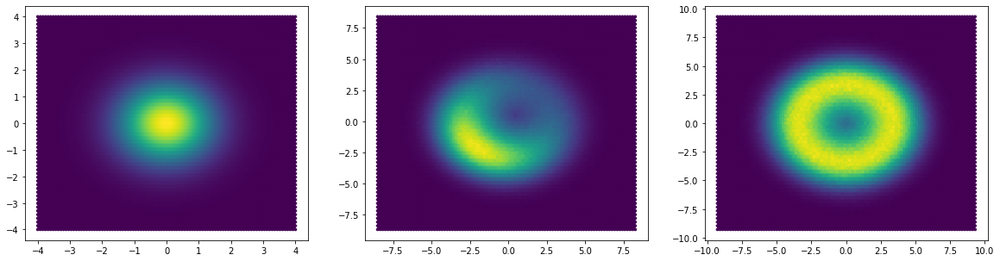

In [6]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

x = np.linspace(-4, 4,1000)
z = np.array(np.meshgrid(x, x)).transpose(1, 2, 0)
z = np.reshape(z, [z.shape[0] * z.shape[1], -1])
z = tr.tensor(z).float()

flow1 = CircularFlow(2)
flow1.z_0.data = tr.tensor([[0.5,0.5]])
flow1.alpha.data = tr.tensor([1.])
flow1.beta.data = tr.tensor([4.])
q1 = distrib.TransformedDistribution(q0, flow1)
q1_samples = q1.sample_n(int(10e6))

flow2 = CircularFlow(2)
flow2.z_0.data = tr.tensor([[0,0]])
flow2.alpha.data = tr.tensor([1.])
flow2.beta.data = tr.tensor([5.])
q2 = distrib.TransformedDistribution(q0, flow2)
q2_samples = q2.sample_n(int(10e6))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
ax1.hexbin(z[:,0], z[:,1], C=q0.log_prob(z).exp())
ax2.hexbin(q1_samples[:,0], q1_samples[:,1])
ax3.hexbin(q2_samples[:,0], q2_samples[:,1])


These are rather complicated nonlinear transformations that are invertible, but we have no analytical expression for the inverse. Hence computing the density analytically for arbitrary values is not possible (at least exactly). So lets consider more simplistic flows for which we have a analytical inverse.

### Linear Flow 

A linear flow is essentially an invertible linear transformation of the form
$$ f(z) = Wz$$
where $W$ is a $d \times d$ invertible matrix that paramterizes the transformation. The problem is that we first have to ensure that $W$ stays invertible, second the Jacobian is $W$ hence in general computing its determinatn requries $O(d^3)$ and third computing the inverse also has a time complexity of $O(d^3)$.

However we can drastically simplify this by using the LU decomposition, then we can write $W = L(U + diag(s))$. Here $L$ is a lower triangular matrix with ones in the diagonal (hence $\det L = 1$), $U$ is a upper triangular decomposition with zeros on the diagonal (hence $\det U = 0$) and $s$ is a vector which contains the diagonal entries of $U$. Hence computing the determinants reduces to 
$$ \det W = \det(diag(s)) = \sum_{i=1}^d \log |s_i|$$
and further inverting the map becomes easy.

### ReLU flow 
ReLUs are popular neural activation functions. However note that the typical ReLU $f(x) = \max(0,x)$ is not invertible! However we can consider leaky ReLUs given by 
$$ f(x) = \begin{cases} x & \text{ if } x > 0 \\ \alpha \cdot x & \text{ else} \end{cases}$$
Where alpha is typically a small constant e.g $\alpha = 0.001$. This mapping is invertible and its inverse is realy simple given by
$$ f^{-1}(x) = \begin{cases} x & \text{ if } x > 0 \\ \frac{1}{\alpha}\cdot x &\text{ else } \end{cases}$$
Further it is an elementwise operation, hence the Jacobian is diagonal and the determinant is given by 
$$ \log \left| \det \frac{\partial f}{\partial x}\right| = \sum_{i=1}^d \log \left| \begin{cases} 1 & \text{ if } x > 0 \\ \alpha & \text{else} \end{cases} \right|$$

### Batch Norm Flow 
Batch normalization can also be interpreted as elementwise operation hene also a flow. Bath normalization is defined as 
$$ \hat{x}_b = \frac{x_b - \hat{\mu}_b}{\sqrt{\hat{\sigma}_b^2 + \epsilon}} \qquad f(x) = \gamma \hat{x}_b + b$$
where $x_b$ is one batch of data and $\hat{\mu}_b = \mathbb{E}[x_b]$ and $\hat{\sigma}_b^2 = Var[x_b]$ are the batch mean and variance. Further $\gamma$ and $\beta$ are two trainable paramters representing shift and scales. We can easily invert this simply by 
$$ \hat{x}_b = \frac{x_b - \beta}{\gamma} \qquad f^{-1}(x_b) = \hat{x}_b \cdot \sqrt{\hat{\sigma}_b^2 + \epsilon} + \hat{\mu}_b$$
The log determinant of the Jacobian is also easy to determine and is 
$$ \log \left| \det\frac{\partial f}{\partial x} \right|= \sum_{i=1}^d \left[\log(\gamma_i)-\frac{1}{2}\log (\hat{\sigma_i}^2 + \epsilon)\right]$$

Notice that these are all the main ingredient s for modern deep learning which we can easily translate to normalizing flows.

In [4]:
class LinearFlow(Flow):
    def __init__(self, dim, init_W=None,*args, **kwargs):
        super(LinearFlow, self).__init__(*args,**kwargs)
        self.event_dim = dim
        # Paramters
        W = tr.Tensor(dim,dim)
        if init_W == None:
            nn.init.orthogonal_(W)
        else:
            W=init_W
        P, L, U = tr.lu_unpack(*W.lu())
        self.P = P
        self.mask_U = tr.triu(tr.ones(W.size()), 1)
        self.mask_L = tr.tril(tr.ones(W.size()), -1)
        self.L = nn.Parameter(L*self.mask_L)
        self.U = nn.Parameter(U*self.mask_U)
        self.s = nn.Parameter(tr.diag(U))
        self.I = tr.eye(dim,dim)

    def _call(self, x):
        L = self.L * self.mask_L + self.I 
        U = self.U * self.mask_U + tr.diag(self.s)
        return x @ (self.P@L@U)
    
    def _inverse(self, y):
        L = self.L * self.mask_L + self.I 
        U = self.U * self.mask_U + tr.diag(self.s)
        #return tr.solve(y.reshape((self.dim,1)),self.P@L@U)[0].flatten()
        return y@ tr.inverse(self.P@L@U)

    def log_abs_det_jacobian(self, x,y):
        return tr.log(self.s.abs() + 10e-9).sum().unsqueeze(0).repeat(y.size(0), 1)

class ReLUFlow(Flow):
    def __init__(self,dim):
        super(ReLUFlow, self).__init__()
        self.event_dim = dim
        self.alpha = nn.Parameter(tr.ones(1))
    def _call(self, x):
        return tr.where(x >= 0, x, tr.abs(self.alpha)*x)
    def _inverse(self, y):
        return tr.where(y >= 0, y, tr.abs(1./self.alpha)*y)
    def log_abs_det_jacobian(self,x,y):
        I = tr.ones_like(y)
        J = tr.where(y >= 0, I, self.alpha * I)
        log_abs_det = tr.log(J.abs() + 10e-9)
        return tr.sum(log_abs_det, dim=1)

class BatchNormFlow(Flow):
    def __init__(self, dim, eps=1e-5):
        super(BatchNormFlow, self).__init__()
        self.event_dim = dim
        # Batch statistics
        self.mean = tr.zeros(dim)
        self.var = tr.ones(dim)
        self.eps = eps
        # Paramters
        self.gamma = nn.Parameter(tr.ones(dim))
        self.beta = nn.Parameter(tr.zeros(dim))

    def constrained_gamma(self):
        return F.relu(self.gamma) + 1e-6
    def _call(self,x):
        self.mean = x.mean(axis=0)
        self.var = x.var(axis=0) + self.eps
        x_hat = (x-self.mean)/self.var.sqrt()
        return self.constrained_gamma() * x_hat + self.beta
    def _inverse(self,y):
        x_hat = (y-self.beta)/self.constrained_gamma()
        return x_hat * self.var.sqrt() + self.mean
    def log_abs_det_jacobian(self,x,y):
        var = y.var(0) + self.eps
        log_det = (self.constrained_gamma().log() - 0.5 * tr.log(var + self.eps)).sum()
        return log_det

Lets also investigate how these transforms change a standard normal distribution.

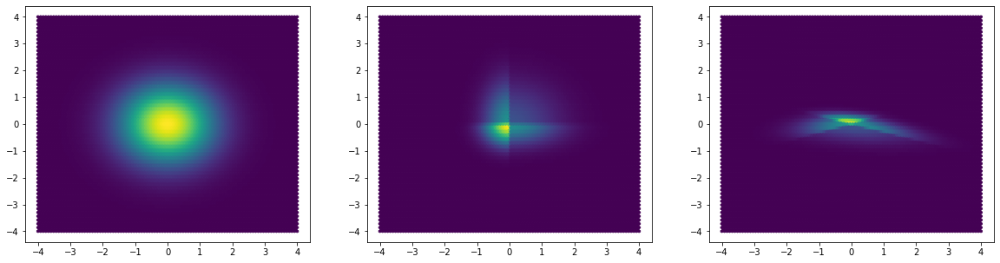

In [6]:
q0 = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

x = np.linspace(-4, 4,500)
z = np.array(np.meshgrid(x, x)).transpose(1, 2, 0)
z = np.reshape(z, [z.shape[0] * z.shape[1], -1])
z = tr.tensor(z).float()

flow1 = ReLUFlow(2)
flow1.alpha.data = tr.tensor([0.5])
q1 = distrib.TransformedDistribution(q0, flow1)

flow2 = LinearFlow(2,init_W =tr.randn(2,2))
q2 = distrib.TransformedDistribution(q1, flow2)


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
ax1.hexbin(z[:,0], z[:,1], C=q0.log_prob(z).exp().detach())
ax2.hexbin(z[:,0], z[:,1], C=q1.log_prob(z).exp().detach())
ax3.hexbin(z[:,0], z[:,1], C=q2.log_prob(z).exp().detach())

## 3) Density estimation

With this in mind, similarly to fitting any other probabilistic model, fitting a flow-based model $p_x(x;\theta)$ to a target $p_x^*(x)$ can be done by minimizing some divergence between them with respect to $\theta$. A common choice is the Kullback-Leibler (KL) divergence.

$$D_{KL}(p||q) = \int p(x) \log \frac{p(x)}{q(x)} = \mathbb{E}_p[\log p(x)] - \mathbb{E}_p[\log q(x)]$$

Note that this "metric" is not symmetric, hence it makes a difference how we evaluate it. The **forward KL divergence** between the target distribution $p_x^*(x)$ and the flow-based model $p_x(x;\theta)$ can be written as

$$ \mathcal{L}(\theta) = D_{KL}(p_x^*(x)||p_x(x;\theta)) = - \mathbb{E}_{p_x^*}[\log p_x(x;\theta)] + const = - \mathbb{E}_{p_x^*}\left[\log p_0(f^{-1}(x; \phi);\psi) + \log \left| \det \frac{\partial f(x)}{\partial x} \right|\right] + const $$

The forward KL-divergence is well suited if we have samples or can sample from the target distribution, but not necessarily can evaluate it. We then can approximate the expectations by Monte Carlo methods:
$$ \mathcal{L}(\theta) = -\frac{1}{N} \sum_{i=1}^N \log p_0(f^{-1}(x_i; \phi);\psi) + \log \left| \det \frac{\partial f(x)}{\partial x} \right| $$

Minimizing the above expresion fits the flow-based model to samples $\{x_n\}_{i=1}^N$.

However in order to do this we need the inverse $f^{-1}$, its Jacobian determinant and the base distributions density $p_0$. That is problematic as for the introduced flows we do not have a inverse!

Alternatively we may fit the reverse KL divergence 
$$ \mathcal{L}(\theta) = D_{KL}(p_x(x;\theta)||p_x^*(x)) = \mathbb{E}_{p_x} \left[ \log p_x(x;\theta) - \log p_x^*(x)\right] =\mathbb{E}_{p_0}[\log p_0(z;\psi) - \log\left| \det \frac{\partial f(x)}{\partial x}\right| - \log p_x^*(f^(z))]$$

Nice here we only need to be able to sample from the base distribution and evaluate the forward transformation. We an do this easily!

Text(0.5, 1.0, 'Target density')

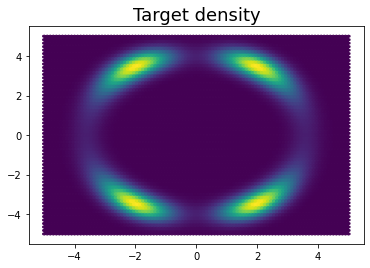

In [7]:
def density_ring(z):
    z1, z2 = tr.chunk(z, chunks=2, dim=1)
    norm = tr.sqrt(z1 ** 2 + z2 ** 2)
    exp1 = tr.exp(-0.5 * ((z1 - 2) / 0.8) ** 2)
    exp2 = tr.exp(-0.5 * ((z1 + 2) / 0.8) ** 2)
    u = 0.5 * ((norm - 4) / 0.4) ** 2 - tr.log(exp1 + exp2)
    return tr.exp(-u)

# Plot it
x = np.linspace(-5, 5, 1000)
z = np.array(np.meshgrid(x, x)).transpose(1, 2, 0)
z = np.reshape(z, [z.shape[0] * z.shape[1], -1])
plt.hexbin(z[:,0], z[:,1], C=density_ring(tr.Tensor(z)).numpy().squeeze())
plt.title('Target density', fontsize=18)

In [42]:
class NormalizingFlow(nn.Module):

    def __init__(self, dim, transforms, density):
        super().__init__()
        biject = []
        for f in transforms:
            biject.append(f)
        self.transforms = transform.ComposeTransform(biject)
        self.bijectors = nn.ModuleList(biject)
        self.base_density = density
        self.final_density = distrib.TransformedDistribution(density, self.transforms)
        self.log_det = []

    def forward(self, z):
        self.log_det = []
        # Applies series of flows
        for b in range(len(self.bijectors)):
            self.log_det.append(self.bijectors[b].log_abs_det_jacobian(z,z))
            z = self.bijectors[b](z)
        return z, self.log_det

In [82]:
# Create normalizing flow
flow = NormalizingFlow(dim=2, transforms=[PlanarFlow(2) for i in range(24)], density=distrib.MultivariateNormal(tr.zeros(2), tr.eye(2)))

In [83]:
def loss(density, zk, log_jacobians):
    sum_of_log_jacobians = sum(log_jacobians)
    return (-sum_of_log_jacobians - tr.log(density(zk)+1e-9)).mean()

In [84]:
optimizer = optim.Adam(flow.parameters(), lr=1e-2)

In [85]:
ref_distrib = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

for it in range(5001):
    samples = ref_distrib.sample((256, ))
    zk, log_jacobians = flow(samples)
    optimizer.zero_grad()
    loss_v = loss(density_ring, zk, log_jacobians)
    loss_v.backward()
    optimizer.step()
    if (it % 500 == 0):
        print('Loss (it. %i) : %f'%(it, loss_v.item()))

Loss (it. 0) : 20.707500
Loss (it. 500) : 2.058674
Loss (it. 1000) : 1.934561
Loss (it. 1500) : 1.335275
Loss (it. 2000) : 1.239600
Loss (it. 2500) : 1.219776
Loss (it. 3000) : 0.832940
Loss (it. 3500) : 0.633975
Loss (it. 4000) : 0.541738
Loss (it. 4500) : 0.574680
Loss (it. 5000) : 0.530279


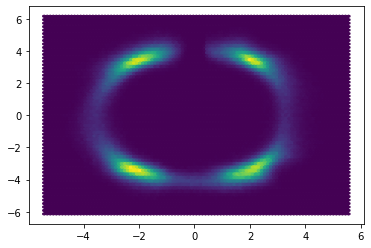

In [86]:
zk, _ = flow(ref_distrib.sample_n(1000000))
zk = zk.detach().numpy()
plt.hexbin(zk[:,0], zk[:,1])

This looks rather good! Lets also try the same for a linear/relu network.

In [116]:
transforms = []
for _ in range(20):
    transforms.extend([LinearFlow(2), ReLUFlow(2), BatchNormFlow(2)])

flow = NormalizingFlow(dim=2, transforms=transforms, density=distrib.MultivariateNormal(tr.zeros(2), tr.eye(2)))

In [117]:
optimizer = optim.Adam(flow.parameters(), lr=1e-3)

In [118]:
ref_distrib = distrib.MultivariateNormal(tr.zeros(2), tr.eye(2))

for it in range(2001):

    samples = ref_distrib.sample((1024, ))
    zk, log_jacobians = flow(samples)
    
    # Evaluate loss and backprop
    optimizer.zero_grad()
    loss_v = loss(density_ring, zk, log_jacobians)
    loss_v.backward()
    optimizer.step()

    if (it % 400 == 0):
        print('Loss (it. %i) : %f'%(it, loss_v.item()))



Loss (it. 0) : 18.340813
Loss (it. 400) : 12.005227
Loss (it. 800) : 4.317112
Loss (it. 1200) : 1.946143
Loss (it. 1600) : 1.542192
Loss (it. 2000) : 1.468050


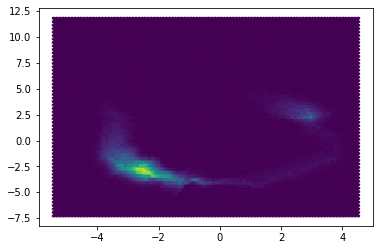

In [119]:
zk, _ = flow(ref_distrib.sample_n(100000))
zk = zk.detach().numpy()
plt.hexbin(zk[:,0], zk[:,1])

This flow does not perform that good. We would need to stack way more flows to obtain a similar expressivness as the Planar Flow. Note it is also rather unstable and often results in "not a number"? Maybe some implementation error...

## Sources

* Rezende, D., & Mohamed, S. (2015, June). Variational inference with normalizing flows. In International Conference on Machine Learning (pp. 1530-1538). PMLR.
* Papamakarios, G., Nalisnick, E., Rezende, D. J., Mohamed, S., & Lakshminarayanan, B. (2019). Normalizing flows for probabilistic modeling and inference. arXiv preprint arXiv:1912.02762.

The notebook is based on the tutorial given in https://github.com/acids-ircam/pytorch_flows with some modifications